# Final Project Notebook - Spring 2024

**The Libraries for this project:**

MatPlotLib is used to Graph and display data.

imageio and PIL are used to import and display images.

_Torch is a library used for neural networking.  It includes common built in functions which will make our life much easier._

In [ ]:
import matplotlib.pyplot as plt #these are the libraries we need to import for this project
import imageio
import torch
import torchvision
from torchvision import models, transforms
import numpy as np
from torchvision.models import *
from PIL import Image
import requests
from torchvision import models
from torchsummary import summary

**A Custom Plot Function**

The purpose of this function is to set some defaults in MatPlotLib that we don't have to specify each time we graph something.

In [ ]:
def plot(x): #x is our input
    fig, ax = plt.subplots()
    im = ax.imshow(x,cmap='gray') #we set our colormap to gray
    ax.axis('off') #turn axes off
    fig.set_size_inches(20, 20) #and make our graph 20x20 inches
    plt.show() #finally, we display the plot

We will use our imageio library to import an image from a url, and our custom plot function to plot it

In [ ]:
im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png') #import our image from url

<ipython-input-3-2086ec9e0cf6>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://raw.githubusercontent.com/imageio/imageio-binaries/master/images/imageio_banner.png')


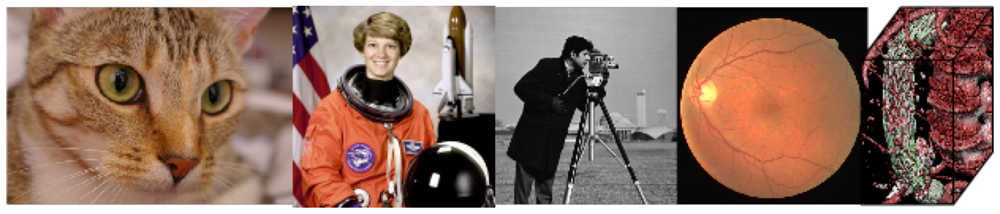

In [ ]:
plot(im) #display it using the custom plot function

AlexNet is a common neural network for image classification.  We can import a pretrained version of it to help with our project.

In [ ]:
net = alexnet(pretrained=True).cuda(0) #this imports a pretrained version of alexnet

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:04<00:00, 50.7MB/s]


In order for our neural network to train as effectively as possible, we have to normalize our data, and convert it into tensors.  We do this by subtracting the mean value for each color channel, and then dividing each by its standard deviation.

We also need to crop our images so they're all the same size tensors.

In [ ]:
normalize = transforms.Normalize( #we can pull the normalize method from the transforms library and input our means and stdvs
   mean=[0.485, 0.456, 0.406], #the means for each channel (r, g, and b)
   std=[0.229, 0.224, 0.225] #the stdvs for each channel
)
preprocess = transforms.Compose([ #we use the compose method to shrink our images down and crop them
   transforms.Resize(256), #this shrinks our images down
   transforms.CenterCrop(224), #this crops our images from the center (to make them square)
   transforms.ToTensor(), #this changes the images into a tensor for alexnet to use
   normalize #we pull the normalize method from earlier to normalize our data AFTER we shrink and crop it
])

In [ ]:
im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg') #lets get another image

<ipython-input-7-772805ffc2cf>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('https://www.medicalnewstoday.com/content/images/articles/322/322868/golden-retriever-puppy.jpg')


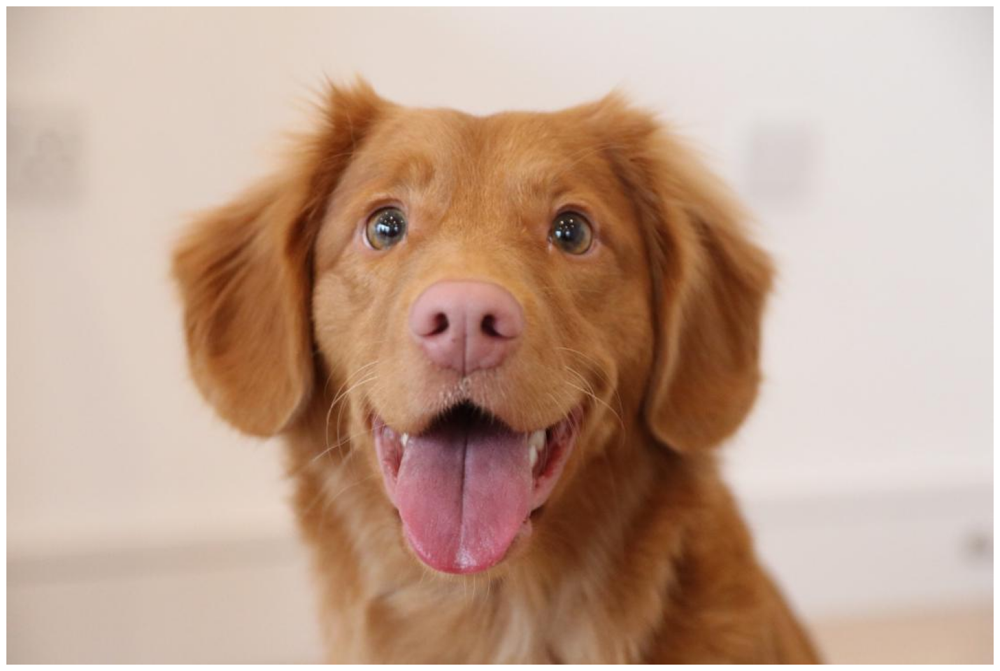

In [ ]:
plot(im) #plot the image (what a cute dog)

In [ ]:
image = Image.fromarray(im) #change the image to an Image object in the PIL library

In [ ]:
img_tensor = preprocess(image) #now we can process our image using the earlier functions we defined for normalization and resizing

In [ ]:
img_tensor = img_tensor.unsqueeze_(0) #we use this method to add a first dimension to our image (this is so it is properly defined for torch)

In [ ]:
img_tensor.shape #now we see our image is in the correct format for torch to use

torch.Size([1, 3, 224, 224])

**The Cuda Method**

The cuda() method is a very important part of the torch library.  Cuda lets use move tensors off of the CPU and onto the GPU for faster computation.  This is essential in neural networks which perform millions upon millions of calculations in fractions of seconds, which is what GPU's are optimized for, not CPU's.

In [ ]:
img_variable = torch.tensor(img_tensor).cuda(0) #lets move our tensor to the gpu

<ipython-input-13-a3c4eb55103d>:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
out = net(img_variable) #we now run it through alexnet, and get alexnet's resulting vector, which we store to the "out" variable

In [ ]:
label_index = out.cpu().data.numpy().argmax() #the max value on our alexnet vector is our guess

In [ ]:
label_index #we see that the 207th index on our vector is alexnet's guess

207

In [ ]:
top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:]) #this function will extract the top ten max guesses of alexnet to a new list variable

**Guess Keys**

For image classification, the program doesn't understand exactly what the image is that it is guessing, rather it is saying "This image looks a lot like the other images I trained on in this group!"  Thus we need a key from somewhere to show us WHAT each category is in its result vector. To do that we get Labels (made by the people who trained the network) from a url and import them.

In [ ]:
LABELS_URL = 'https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json' #import our labels

In [ ]:
labels = {int(key):value for (key, value) in requests.get(LABELS_URL).json().items()} #we'll save each label to a dictionary so we can easily reference it

In [ ]:
print(labels[label_index]) #now we see what label corresponds to the max value in the result vector (its a golden retriever dog according to alexnet)

golden retriever


In [ ]:
for i in range(10): #we can see the top 10 guesses, and most of them are dogs
    print(labels[top_list[i]])

golden retriever
Irish setter, red setter
Sussex spaniel
Tibetan mastiff
chow, chow chow
Brittany spaniel
tennis ball
clumber, clumber spaniel
redbone
vizsla, Hungarian pointer


**Alexnet: Under the Hood**

Alexnet is a neural network with 19 layers.

Twelve layers are convolution layers.  These layers are meant to slowly shrink down our tensor into a matrix which can be classified by the classifier layers.  Each of these layers consists of a feature and the featuremap is passed on to the next layer.

The Pooling layer once again normalizing the result into a 6x6 matrix for the classifier to use

Lastly, Alexnet flattens the matrix and sends it through 6 fully connected classifier layers to get our final vector, which contains our "guesses."

In [ ]:
net #we can see what alexnet is if we look under the hood.
#there are 10 convolutional layers for shrinking the data down
#then there is our "averaging layer" which makes our featuremap into a 6x6 matrix
#finally we have 6 fully connected classifier layers to convert our input into a classified vector.

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [ ]:
summary(net, (3, 224, 224))  #another look under the hood this time using the summary function from torchvision, which gives us a look at the size of each layer

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 64, 55, 55]          23,296
              ReLU-2           [-1, 64, 55, 55]               0
         MaxPool2d-3           [-1, 64, 27, 27]               0
            Conv2d-4          [-1, 192, 27, 27]         307,392
              ReLU-5          [-1, 192, 27, 27]               0
         MaxPool2d-6          [-1, 192, 13, 13]               0
            Conv2d-7          [-1, 384, 13, 13]         663,936
              ReLU-8          [-1, 384, 13, 13]               0
            Conv2d-9          [-1, 256, 13, 13]         884,992
             ReLU-10          [-1, 256, 13, 13]               0
           Conv2d-11          [-1, 256, 13, 13]         590,080
             ReLU-12          [-1, 256, 13, 13]               0
        MaxPool2d-13            [-1, 256, 6, 6]               0
AdaptiveAvgPool2d-14            [-1, 25

In [ ]:
out = net.features[0](img_variable).cpu().detach().numpy() #this is what our image looks like after we send it through the first layer

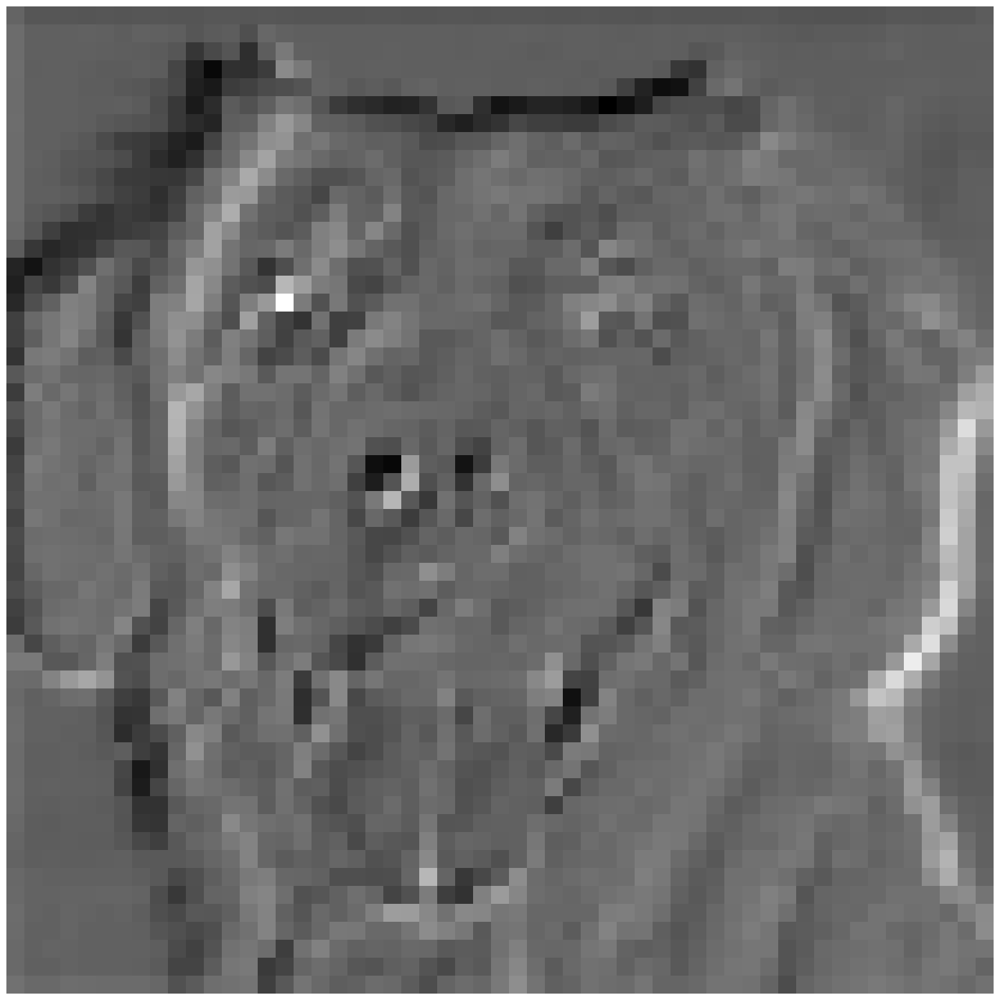

In [ ]:
plot(out[0,0,:,:]) #show the featuremap

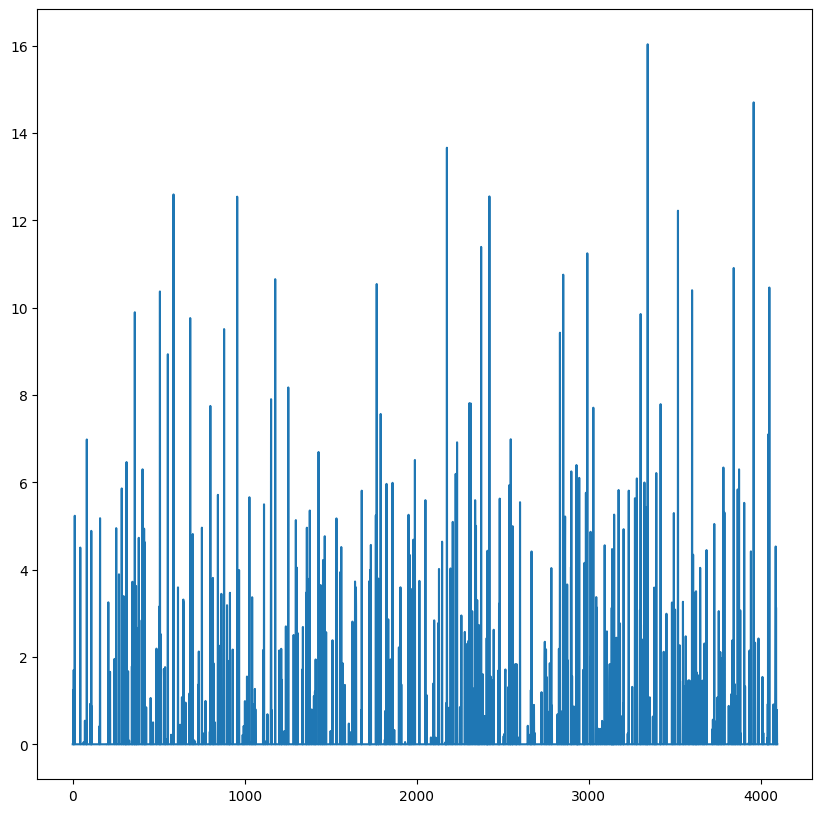

In [ ]:
plt.plot(np.arange(4096),net.classifier[0:6](net.avgpool(net.features[0:13](img_variable)).flatten()).cpu().detach().numpy()) #now we look at the final classifier layer
fig = plt.gcf() #this will show what the highest correlation guess according to alexnet are
fig.set_size_inches(10, 10)

In [ ]:
im = imageio.imread('http://bocasurfcam.com/most_recent_image.php') #now we can use another example, let's grab the most recent image of boca raton beach

<ipython-input-27-db4016f420a5>:1: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  im = imageio.imread('http://bocasurfcam.com/most_recent_image.php')


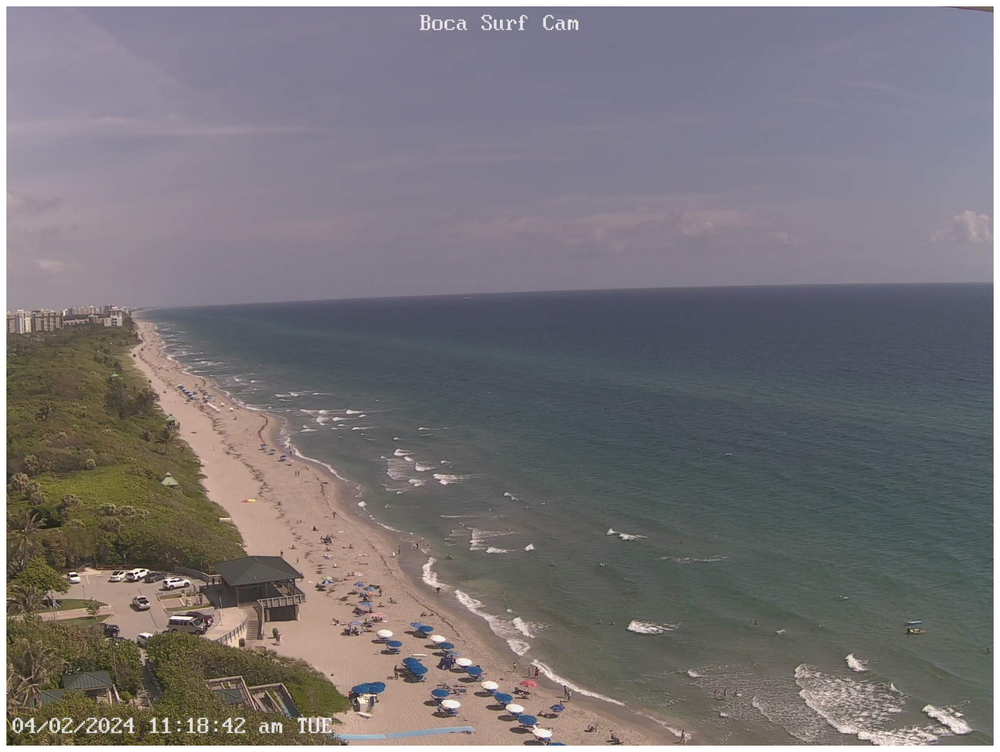

In [ ]:
plot(im) #here's the image

In [ ]:
def load_im(im): #lets make a function that automatically loads images and converts them to torch tensor objects
    image = Image.fromarray(im) #convert to PIL
    img_tensor = preprocess(image) #using the preprocess function we normalize the image
    img_tensor = img_tensor.unsqueeze_(0) #then we add the first dimension, necessary for torch
    img_variable = torch.tensor(img_tensor).cuda(0) #load the image onto the GPU
    return img_variable #and finally return our image as a torch tensor on the GPU ready to load into alexnet

In [ ]:
out = net(load_im(im))

<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


In [ ]:
def inference(im): #we can make an inference function to automatically label our image based on the alexnet classifier vector
    out = net(load_im(im)) #first we save the classifier vector to a local variable, and use our conversion function we just made
    label_index = out.cpu().data.numpy().argmax() #then we get the highest percentage guess and save it
    top_list = np.flip(np.argsort(out.cpu().data.numpy())[0][-10:]) #now we can also take the top ten guesses and save them to a list
    print(labels[label_index]) #next we'll print the corresponding label for our top guess
    print('____')
    for i in range(10): #followed by a list of the top ten guess labels
        print(labels[top_list[i]])

In [ ]:
inference(im) #after we run the image through our inference function, we can see that all the work is already done for us by our functions, and we simply get the output
#which is the top guess followed by the top ten guesses

seashore, coast, seacoast, sea-coast
____
seashore, coast, seacoast, sea-coast
promontory, headland, head, foreland
sandbar, sand bar
breakwater, groin, groyne, mole, bulwark, seawall, jetty
cliff, drop, drop-off
valley, vale
lakeside, lakeshore
alp
volcano
dalmatian, coach dog, carriage dog


<ipython-input-29-4f8a3494e1c8>:5: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  img_variable = torch.tensor(img_tensor).cuda(0)


# Restart Notebook (Disconnect and Delete Runtime) Before Running Next Section

# Custom Data Deck

# Ryan McDaniel: Final Project Alexnet

My final project contains 50 pictures of traffic lights, green and red.

I will run them through alexnet to see if it can differentiate them.

[Data Slideshow](https://docs.google.com/presentation/d/18WBrYvJbVjY6uxh0-IUJwD0cSwkwJHtPkriP7VpIyTs/edit#slide=id.p)

In [ ]:
%%capture
!pip install wandb #First, we install some google colab inbuilt libraries
!apt-get install poppler-utils
!pip install pdf2image
!pip install flashtorch
import requests #and we import the other libraries we need for this project
from pdf2image import convert_from_path
import matplotlib.pyplot as plt #pyplot will help us graph some visualizations for our project
import numpy as np #numerical python is necessary for modifying our tensors and works well with matplotlib for displaying
import torch #torch is our most important library.  Torch is the framework off of which most python neural networks operate
import requests
from torchvision import *
from torchvision.models import *
from flashtorch.utils import apply_transforms
import wandb as wb

**We need some functions to change our data from numpy arrays into torch tensor objects, and move those objects onto the GPU.**

To do that we will define two functions.

In [ ]:
def GPU(data): #the first function will be for the training data, which will require gradients for back propagation
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))

def GPU_data(data): #we will turn gradients off for the second function, which will save time when running data through the gpu
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=torch.device('cuda'))

**Our next function will make it easier to plot and display images, features, and featuremaps using PyPlot.**

To do this we will set some default preferences into a function used to plot our images.

In [ ]:
def plot(x): #x will be our input data
    fig, ax = plt.subplots() #default for matplotlib
    im = ax.imshow(x, cmap = 'gray') #change the colormap to gray
    ax.axis('off') #turn the axis off
    fig.set_size_inches(5, 5) #make it a 5x5 inch display
    plt.show() #finally print that display to the notebook

**Next we will define some functions to get our slide images into this notebook.**

In [ ]:
def get_google_slide(url): #this first function takes our url for the slide and exports it to a pdf, and returns the url of the pdf
    url_head = "https://docs.google.com/presentation/d/" #header for concatanation
    url_body = url.split('/')[5] #get the presentation identifier from the url
    page_id = url.split('.')[-1] #get the page identifier from the url
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id #and send back the pdf url for use in this project

def get_slides(url): #now we do a function which will pull the individual slides from the pdf
    url = get_google_slide(url) #we'll use our previously defined function to change the google sheets doc to a pdf
    r = requests.get(url, allow_redirects=True) #this line will download the pdf
    open('file.pdf', 'wb').write(r.content) #this line saves the pdf data to this project
    images = convert_from_path('file.pdf', 500) #this converts the slides to individual images, and saves them into our list
    return images #this list is where the magic happens for us, we will change these into torch tensors and run them through alexnet

def load(image): #this last method will change our images list into a torch tensor and load them onto the gpu for alexnet to run

    return apply_transforms(image).clone().detach().requires_grad_(True).to(device) #we transform our input and send them to the GPU

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

**Now we download our "key" to assign labels to our classifier vectors.**

In [ ]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}
#we put them into a dictionary to easily reference them

In [ ]:
model = alexnet(weights='DEFAULT').to(device) #now we will load alexnet onto the gpu as well, with its default weights
model.eval(); #and we will download it to our program

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:03<00:00, 65.2MB/s]


In [ ]:
url = "https://docs.google.com/presentation/d/18WBrYvJbVjY6uxh0-IUJwD0cSwkwJHtPkriP7VpIyTs/edit#slide=id.p" #this is the url to my data sheet

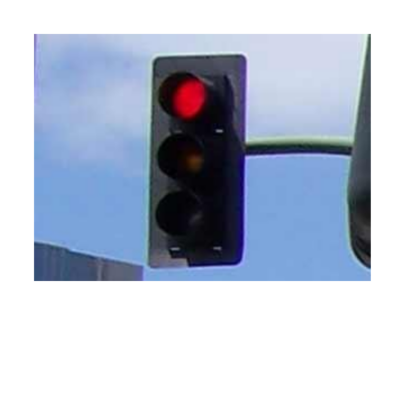

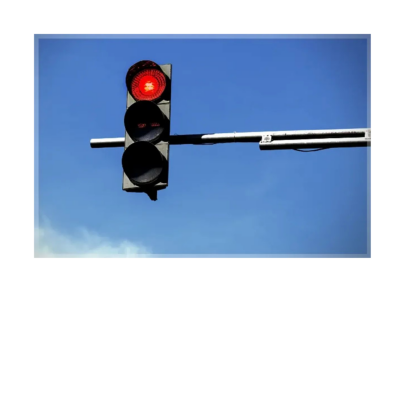

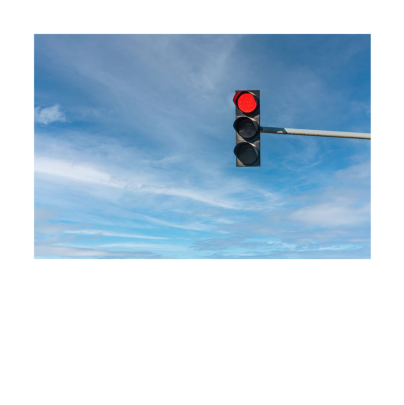

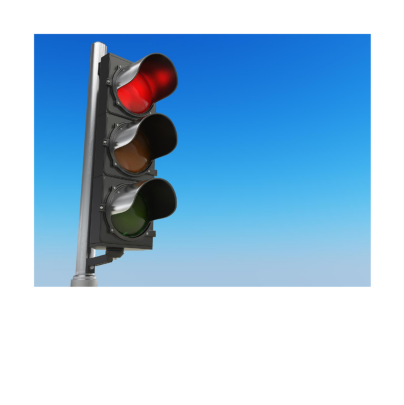

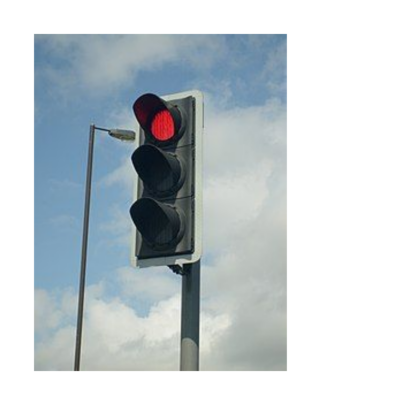

...

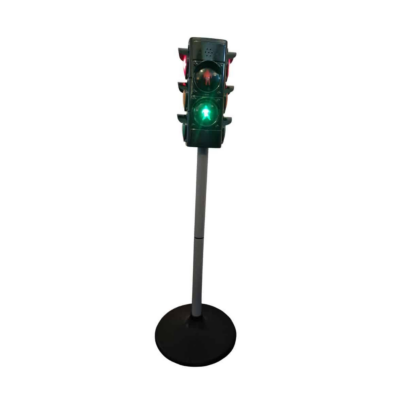

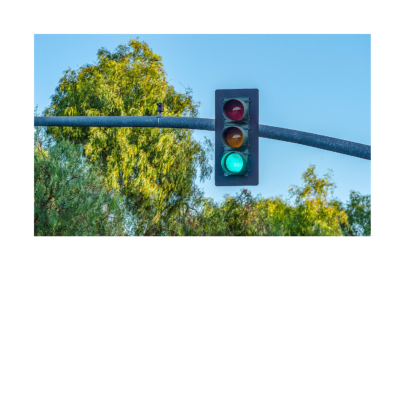

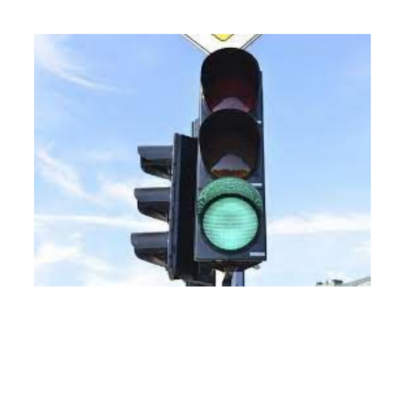

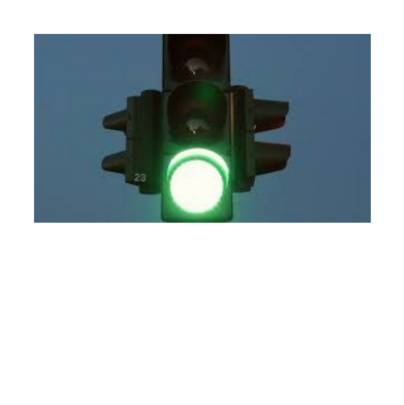

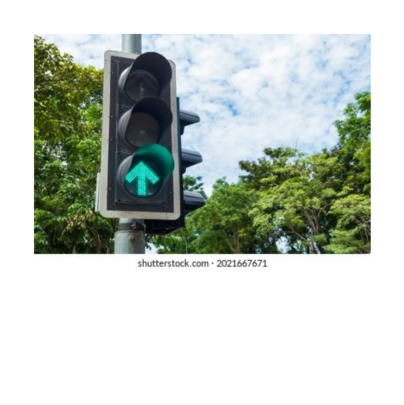

In [ ]:
images = [] #lets make an empty list called images

for image in get_slides(url): #for each slide we're going to load in the image off of each slide using our functions

    plot(image) #lets first display them

    images.append(load(image)) #then load them in one by one

images = torch.vstack(images) #finally we vertically stack them using torch

In [ ]:
images.shape #we can see that we have 50 images in our torch tensor

torch.Size([50, 3, 224, 224])

Here we are using the model function we defined to run the stack through AlexNet

In [ ]:
model(images) #using the model function we previously defined, we get an output matrix with a result vector for each image

tensor([[ -3.1012,  -2.1658,  -3.9337,  ...,  -5.2090,  -2.3702,   1.1422],
        [ -4.4819,  -2.7480,  -0.6969,  ...,  -7.8878,  -3.6136,   2.4800],
        [ -2.9118,   0.2995,  -1.2138,  ..., -10.5132,  -3.3159,   1.8618],
        ...,
        [ -1.5147,  -4.2237,  -3.3696,  ...,  -6.0929,  -1.2195,   1.1166],
        [ -1.6363,  -1.3490,  -3.7905,  ...,  -2.6719,  -1.6264,   2.6652],
        [ -0.2486,  -4.0356,  -2.9221,  ...,  -4.7185,   0.1945,   2.1264]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
y = model(images) #we will save this output to a variable

In [ ]:
y.shape #y is our classifier matrix for all 50 images

torch.Size([50, 1000])

In [ ]:
guesses = torch.argmax(y, 1).cpu().numpy() #now we will take that classifier and take the highest correlation guess and save it to a new array

In [ ]:
for i in list(guesses): #lastly, we will use this array to reference the labels dictionary and see what AlexNet thinks the images are
    print(labels[i])

traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
pill bottle
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
switch, electric switch, electrical switch
switch, electric switch, electrical switch
switch, electric switch, electrical switch
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
traffic light, traffic signal, stoplight
power drill
power drill
traffic light, traffic signal, stoplight
traffic light, 

In [ ]:
Y = np.zeros(50,) #we can make our own classifier dictionary for each slide
Y[25:] = 1

In [ ]:
Y #we will call it y

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
X = y.detach().cpu().numpy() #we can change y into a numpy array

In [ ]:
X.shape #we can see that X is the matrix which contains the classifier vectors

(50, 1000)

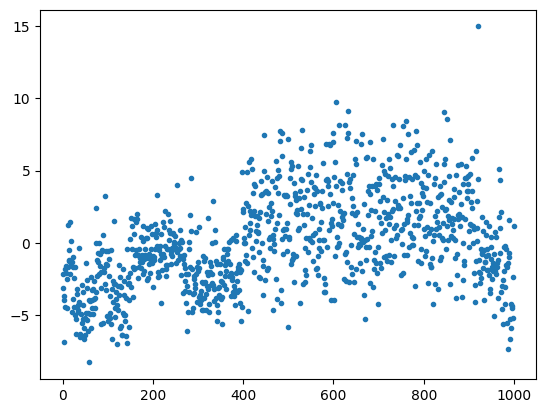

In [ ]:
plt.plot(X[0],'.') #by plotting it, we can see one point stands out, point 920, which is the traffic light indicator

In [ ]:
X[0] #for each of our images we can look at the classifier vector and find which is greatest manually, or we can just use the argmax function in numpy to do it for us

array([-3.10118437e+00, -2.16576838e+00, -3.93372202e+00, -6.84223223e+00,
       -3.68732405e+00, -1.78834927e+00, -4.43452358e+00, -1.57586062e+00,
       -2.05825353e+00, -4.49933100e+00, -2.48047876e+00, -1.70570982e+00,
        1.25461078e+00, -1.22204435e+00, -4.86284643e-01, -1.29165435e+00,
        1.44851327e+00, -2.16661811e+00,  1.17881536e-01, -1.42257738e+00,
       -4.79719496e+00, -1.32596147e+00, -3.92503166e+00, -1.70086193e+00,
       -9.54517543e-01, -2.43307590e+00, -4.43584919e+00, -5.02047873e+00,
       -1.65079975e+00, -5.25998735e+00, -6.33356285e+00, -3.16789031e+00,
       -3.57923651e+00, -4.31247616e+00, -4.67134476e+00, -4.76523542e+00,
       -3.57257605e-01, -4.07024145e+00, -6.54854727e+00, -6.31666994e+00,
       -4.90303802e+00, -6.45365191e+00, -5.52807474e+00, -2.92092729e+00,
       -5.31356764e+00, -3.38795757e+00, -4.33051968e+00, -6.65670776e+00,
       -5.90108919e+00, -5.18874884e+00, -6.38725996e+00, -1.37473834e+00,
       -4.86001062e+00, -

In [ ]:
np.argmax(X[0]) #we can see that the argmax of this list is at index 920

920

In [ ]:
labels[920] #and index 920 indicated that it is an image of a traffic light

'traffic light, traffic signal, stoplight'

In [ ]:
top_ten = np.argsort(X[0])[::-1][0:10] #now we can also find the top ten guesses for the images using this argsort method and save them to this top_ten variable

In [ ]:
for i in top_ten: #we see the top ten guesses for our first image
    print(labels[i])

traffic light, traffic signal, stoplight
iPod
loudspeaker, speaker, speaker unit, loudspeaker system, speaker system
switch, electric switch, electrical switch
television, television system
remote control, remote
joystick
Polaroid camera, Polaroid Land camera
lighter, light, igniter, ignitor
radio, wireless


In [ ]:
labels #now we can print our dictionary and see what kinds of images alexnet is able to identify

{0: 'tench, Tinca tinca',
 1: 'goldfish, Carassius auratus',
 2: 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias',
 3: 'tiger shark, Galeocerdo cuvieri',
 4: 'hammerhead, hammerhead shark',
 5: 'electric ray, crampfish, numbfish, torpedo',
 6: 'stingray',
 7: 'cock',
 8: 'hen',
 9: 'ostrich, Struthio camelus',
 10: 'brambling, Fringilla montifringilla',
 11: 'goldfinch, Carduelis carduelis',
 12: 'house finch, linnet, Carpodacus mexicanus',
 13: 'junco, snowbird',
 14: 'indigo bunting, indigo finch, indigo bird, Passerina cyanea',
 15: 'robin, American robin, Turdus migratorius',
 16: 'bulbul',
 17: 'jay',
 18: 'magpie',
 19: 'chickadee',
 20: 'water ouzel, dipper',
 21: 'kite',
 22: 'bald eagle, American eagle, Haliaeetus leucocephalus',
 23: 'vulture',
 24: 'great grey owl, great gray owl, Strix nebulosa',
 25: 'European fire salamander, Salamandra salamandra',
 26: 'common newt, Triturus vulgaris',
 27: 'eft',
 28: 'spotted salamander, Ambystoma 

(array([ 18., 115., 242., 277., 176., 118.,  44.,   9.,   0.,   1.]),
 array([-8.29137707, -5.96344233, -3.63550806, -1.30757344,  1.02036119,
         3.34829569,  5.67623043,  8.0041647 , 10.33209896, 12.66003418,
        14.98796844]),
 <BarContainer object of 10 artists>)

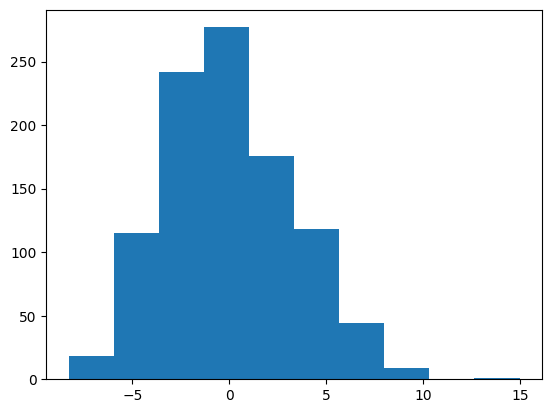

In [ ]:
plt.hist(X[0]) #finally we plot a histogram of our guess vector for the first image

In [ ]:
X = GPU_data(X) #we'll throw these both onto the gpu
Y = GPU_data(Y)

These are our training functions down here.  We use these functions to back propogate our weights and biases to their necessary results.

In [ ]:
def softmax(x): #this function "softmax" makes a distribution for our data using the softmax formula
    s1 = torch.exp(x - torch.max(x,1)[0][:,None])
    s = s1 / s1.sum(1)[:,None]
    return s

In [ ]:
def cross_entropy(outputs, labels): #we get the cross-entropy from this function, cross entropy gives us a more dynamic learning rate for our network
#specifically when the guess is far off, we adjust our weights and biases more than when the guess is near
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0]

In [ ]:
def Truncated_Normal(size): #again we create a function which will generate a truncated normal distribution
#a truncated normal distribution has bounds unlike a regular normal distribution which will keep us within a certain numerical range to start
    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2)
    u2 = torch.rand(size)
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2)

    return z

In [ ]:
def acc(out,y): #lastly our accuracy function will help us see how close our guesses are
    with torch.no_grad():
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0]

In [ ]:
X.shape #our classifier vector

torch.Size([50, 1000])

In [ ]:
def get_batch(mode): #we've used this batch function over the semester to either train or test data on our neural network
    b = c.b #dynamic batch sizing
    if mode == "train":
        r = np.random.randint(X.shape[0]-b)
        x = X[r:r+b,:]
        y = Y[r:r+b]
    elif mode == "test":
        r = np.random.randint(X_test.shape[0]-b)
        x = X_test[r:r+b,:]
        y = Y_test[r:r+b]
    return x,y

In [ ]:
def model(x,w): #lastly we set this model function do do our matrix multiplication for each of our tensors

    return x@w[0]

In [ ]:
def make_plots(): #the make plots function will log our running accuracy to weights and biases as we go

    acc_train = acc(model(x,w),y) #we will use the model and accuracy functions to see the accuracy of each step

    wb.log({"acc_train": acc_train}) #then we log that step to w + b

In [ ]:
wb.init(project="Linear_Model_Photo_1"); #now we use built in w + b methods to start a new project
c = wb.config #config with default settings

c.h = 0.001 #default learning rate
c.b = 4 #batch size
c.epochs = 100000 #the amount of passes we will do

w = [GPU(Truncated_Normal((1000,2)))] #we'll start with randomly generated weights and biases

optimizer = torch.optim.Adam(w, lr=c.h) #and we'll use the built in torch optimizer to update our functions

for i in range(c.epochs): #lastly we'll run the cycle step by step

    x,y = get_batch('train') #we'll use the premade x and y variables and the get_batch function we made earlier to batch them together

    loss = cross_entropy(softmax(model(x,w)),y) #we'll use the cross_entropy and softmax functions to get a running loss which we will also log

    optimizer.zero_grad() #we zero out the gradients so the next step will not be affected by this one (we are sort of clearing the cache of the network here)
    loss.backward() #send the loss to the optimizer which will update our weights and biases
    optimizer.step() #and move to the next iteration

    wb.log({"loss": loss}) #lastly we log a running loss

    make_plots() #and we make the plots using the earlier defined function which will load them to weights and biases website


<IPython.core.display.Javascript object>

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

 ··········


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


<ipython-input-2-51ce246f96da>:2: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  return torch.tensor(data, requires_grad=True, dtype=torch.float, device=torch.device('cuda'))


**Here are our running accuracy and loss.**

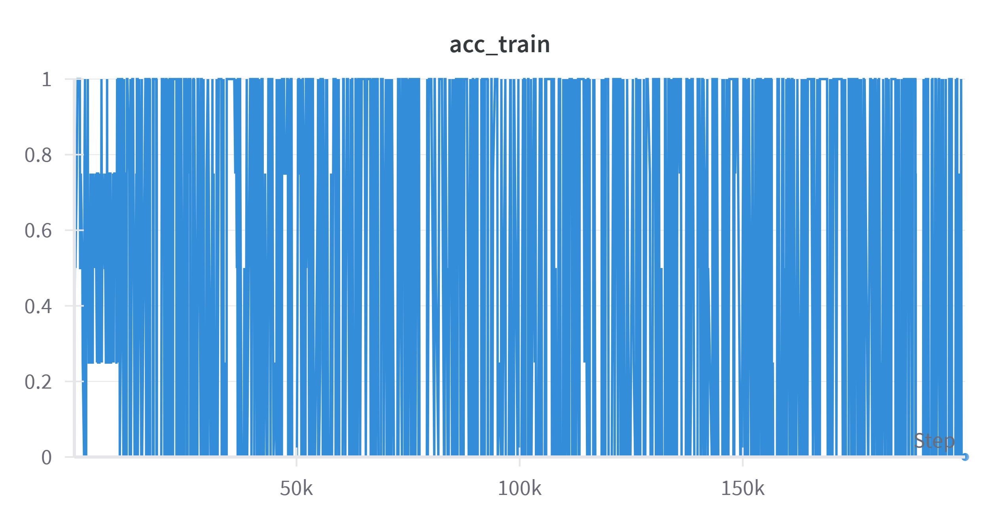

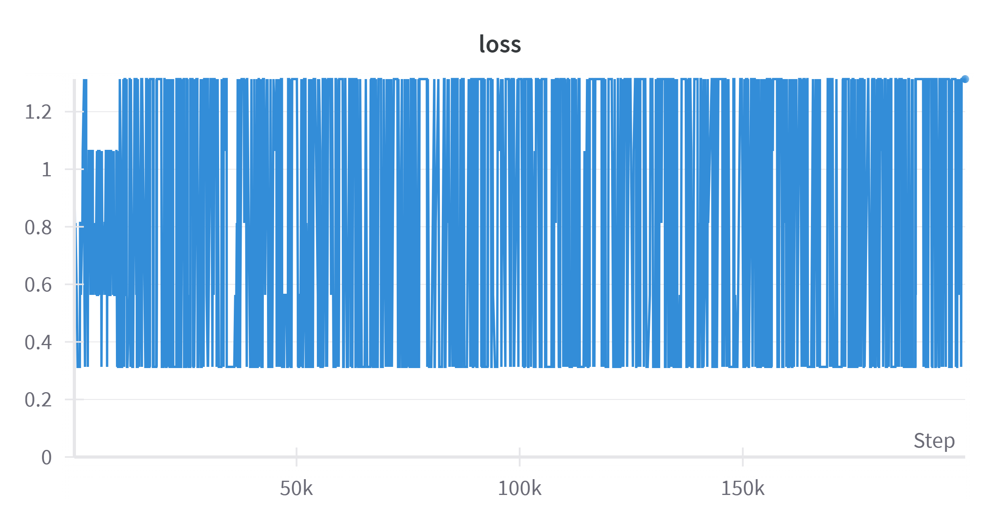

# Conclusion

**Disappointingly, our loss and accuracy don't seem to improve over time.**

This is because the images are very similar to one another, red and green lights being lit is the only difference.  In terms of shape and everything else the data deck is just too small of a sample size to train on.  For minute differences in images we need more training data and more iterations to run through to get a more differentiating result with lowering loss overtime.